In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
import numpy as np

# Load the training data
train = pd.read_csv('train_new.csv')

# Debugging: Display the first few rows of the training data
print(train.head())


# Handle the missing values, we will first test 
for i in train.columns:
    if train[i].dtype == 'object':
        train[i].fillna(train[i].mode()[0], inplace=True)
    else:
        train[i].fillna(train[i].mean(), inplace=True)

# Encoding categorical variables
label_encoders = {}
for i in train.select_dtypes(include=['object']).columns:
    # Skip the ID column
    if i != 'ID': 
        le = LabelEncoder()
        train[i] = le.fit_transform(train[i])
        label_encoders[i] = le

# Convert datetime columns to datetime format and extract year, month, day, try to use this simple preprocessing method first
datetime_cols = ['CropTillageDate', 'RcNursEstDate', 'Harv_date', 'Threshing_date']
for col in datetime_cols:
    train[col] = pd.to_datetime(train[col])
    train[col + '_year'] = train[col].dt.year
    train[col + '_month'] = train[col].dt.month
    train[col + '_day'] = train[col].dt.day

# Drop original datetime columns, only use new columns
train.drop(columns=datetime_cols, inplace=True)

# Normalizing numerical features
scaler = MinMaxScaler()
numeric_columns = train.select_dtypes(include=[np.number]).columns.drop('Yield')
train[numeric_columns] = scaler.fit_transform(train[numeric_columns])

# Preparing the data for modeling
# Training Features
X = train.drop(['ID', 'Yield'], axis=1) 
# Target Feature
y = train['Yield']  

# Splitting the dataset into training and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Debugging: Display the first few rows of the training data
X_train.head()


# First we will use the H2o AutoML library to train the model, 
# We will use three AutoML models in total, and then we will compare the results of the three models to select the best model.
import h2o
from h2o.automl import H2OAutoML

# Start H2O cluster
h2o.init()

# Convert to H2O Frame, We will use the whole dataset for training
h2o_train = h2o.H2OFrame(pd.concat([X_train, y_train], axis=1))
h2o_test = h2o.H2OFrame(pd.concat([X_test, y_test], axis=1))

# Specify target and features
x = h2o_train.columns
y = "Yield"
x.remove(y)

# Run H2O AutoML
aml = H2OAutoML(max_runtime_secs=300)
aml.train(x=x, y=y, training_frame=h2o_train)

# save the memory
import gc
gc.collect() 

                ID District      Block  CultLand  CropCultLand  \
0  ID_GTFAC7PEVWQ9  Nalanda  Noorsarai        45            40   
1  ID_TK40ARLSPOKS  Nalanda     Rajgir        26            26   
2  ID_1FJY2CRIMLZZ     Gaya      Gurua        10            10   
3  ID_I3IPXS4DB7NE     Gaya      Gurua        15            15   
4  ID_4T8YQWXWHB4A  Nalanda  Noorsarai        60            60   

                               LandPreparationMethod CropTillageDate  \
0               TractorPlough FourWheelTracRotavator      2022-07-20   
1  WetTillagePuddling TractorPlough FourWheelTrac...      2022-07-18   
2               TractorPlough FourWheelTracRotavator      2022-06-30   
3               TractorPlough FourWheelTracRotavator      2022-06-16   
4                   TractorPlough WetTillagePuddling      2022-07-19   

   CropTillageDepth         CropEstMethod RcNursEstDate  ... Harv_method  \
0                 5  Manual_PuddledRandom    2022-06-27  ...     machine   
1                 

/tmp/ipykernel_26232/1421622589.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train[i].fillna(train[i].mode()[0], inplace=True)
/tmp/ipykernel_26232/1421622589.py:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)',

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /home/lmmista-wap266/anaconda3/envs/automl/lib/python3.9/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpu_4rb6gq
  JVM stdout: /tmp/tmpu_4rb6gq/h2o_lmmista_wap266_started_from_python.out
  JVM stderr: /tmp/tmpu_4rb6gq/h2o_lmmista_wap266_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,01 secs
H2O_cluster_timezone:,Europe/Berlin
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,2 months and 11 days
H2O_cluster_name:,H2O_from_python_lmmista_wap266_zo0ys1
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,15.68 Gb
H2O_cluster_total_cores:,32
H2O_cluster_allowed_cores:,32
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
17:47:06.739: _train param, Dropping bad and constant columns: [CropTillageDate_day, Threshing_date_day, RcNursEstDate_month, Harv_date_month, RcNursEstDate_day, Harv_date_year, CropTillageDate_year, Threshing_date_month, RcNursEstDate_year, Threshing_date_year, Harv_date_day, CropTillageDate_month]

█
17:47:09.230: _train param, Dropping bad and constant columns: [CropTillageDate_day, Threshing_date_day, RcNursEstDate_month, Harv_date_month, RcNursEstDate_day, Harv_date_year, CropTillageDate_year, Threshing_date_month, RcNursEstDate_year, Threshing_date_year, Harv_date_day, CropTillageDate_month]


17:47:09.639: _train param, Dropping bad and constant columns: [CropTillageDate_day, Threshing_date_day, RcNursEstDate_month, Harv_date_month, RcNursEstDate_day, Harv_date_year, CropTi

473

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
ModelMetricsRegressionGLM: stackedensemble
** Reported on test data. **

MSE: 16010.72004113471
RMSE: 126.53347399457074
MAE: 63.101335282296574
RMSLE: NaN
Mean Residual Deviance: 16010.72004113471
R^2: 0.9376978613396051
Null degrees of freedom: 619
Residual degrees of freedom: 614
Null deviance: 159639151.8005015
Residual deviance: 9926646.42550352
AIC: 7775.712324427413


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
DeepLearning_grid_1_AutoML_1_20240302_174706_model_1,114.893,13200.4,67.1703,nan,13200.4,6631,0.004029,DeepLearning
GBM_grid_1_AutoML_1_20240302_174706_model_75,119.32,14237.3,68.9129,0.37558,14237.3,178,0.008799,GBM
GBM_grid_1_AutoML_1_20240302_174706_model_37,119.621,14309.1,66.5266,nan,14309.1,303,0.008701,GBM
GBM_grid_1_AutoML_1_20240302_174706_model_43,123.049,15141.1,69.7501,nan,15141.1,270,0.0102,GBM
GBM_3_AutoML_1_20240302_174706,123.841,15336.6,68.2044,nan,15336.6,449,0.00935,GBM
GBM_grid_1_AutoML_1_20240302_174706_model_7,124.015,15379.6,65.8537,nan,15379.6,408,0.011214,GBM
GBM_4_AutoML_1_20240302_174706,124.106,15402.3,66.91,nan,15402.3,355,0.010556,GBM
GBM_grid_1_AutoML_1_20240302_174706_model_29,124.144,15411.9,68.6261,nan,15411.9,231,0.011144,GBM
GBM_5_AutoML_1_20240302_174706,125.118,15654.6,66.452,nan,15654.6,226,0.009076,GBM
GBM_grid_1_AutoML_1_20240302_174706_model_45,125.234,15683.5,65.9562,nan,15683.5,505,0.010469,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

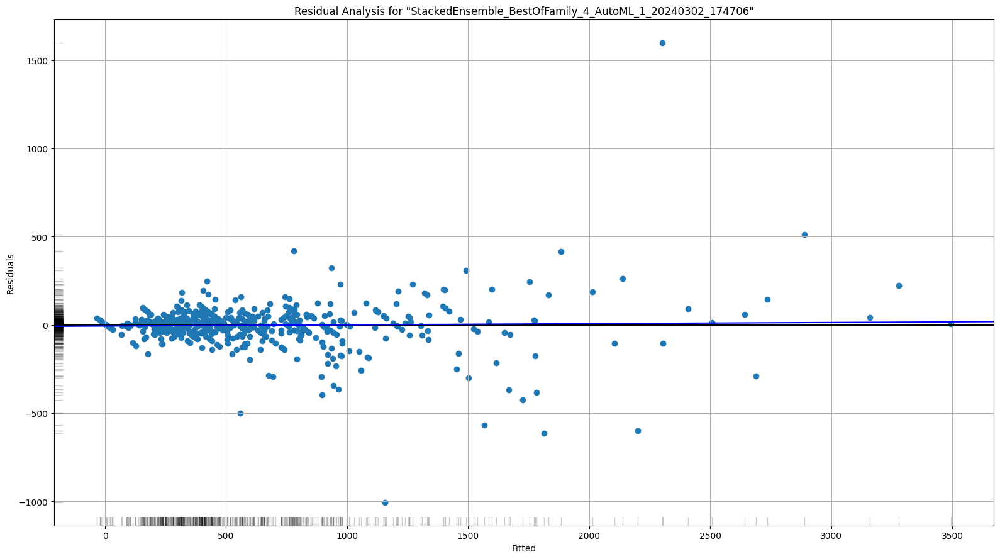

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

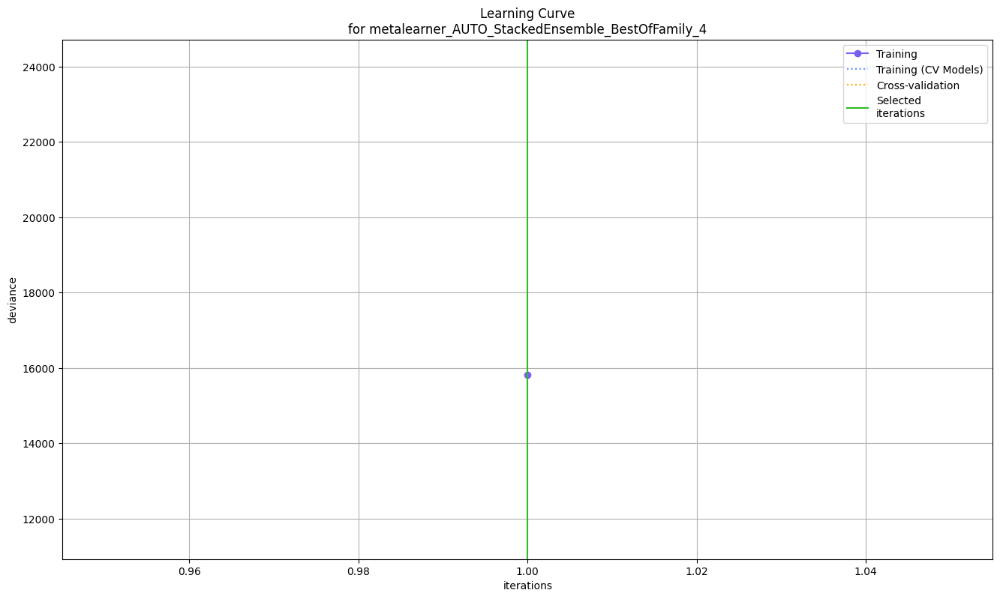

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

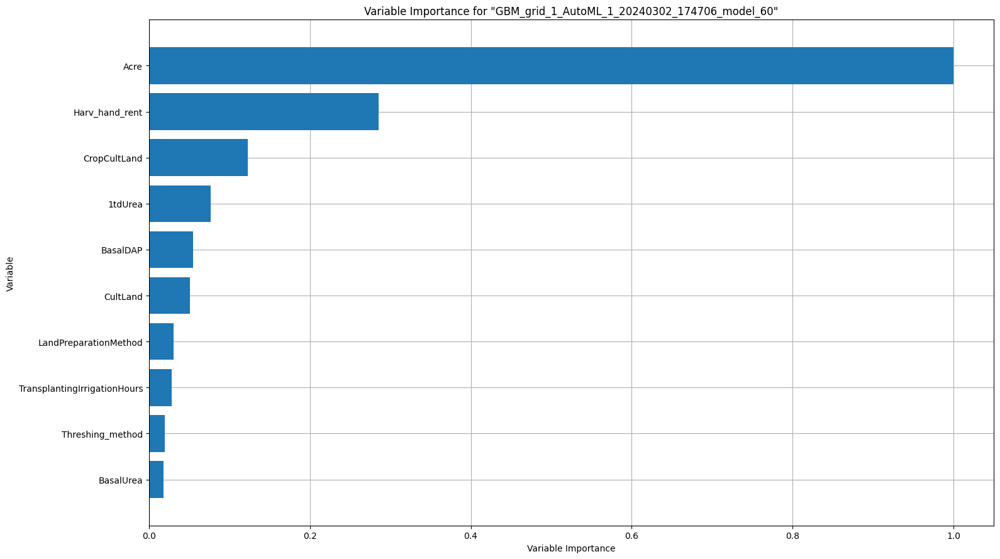

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

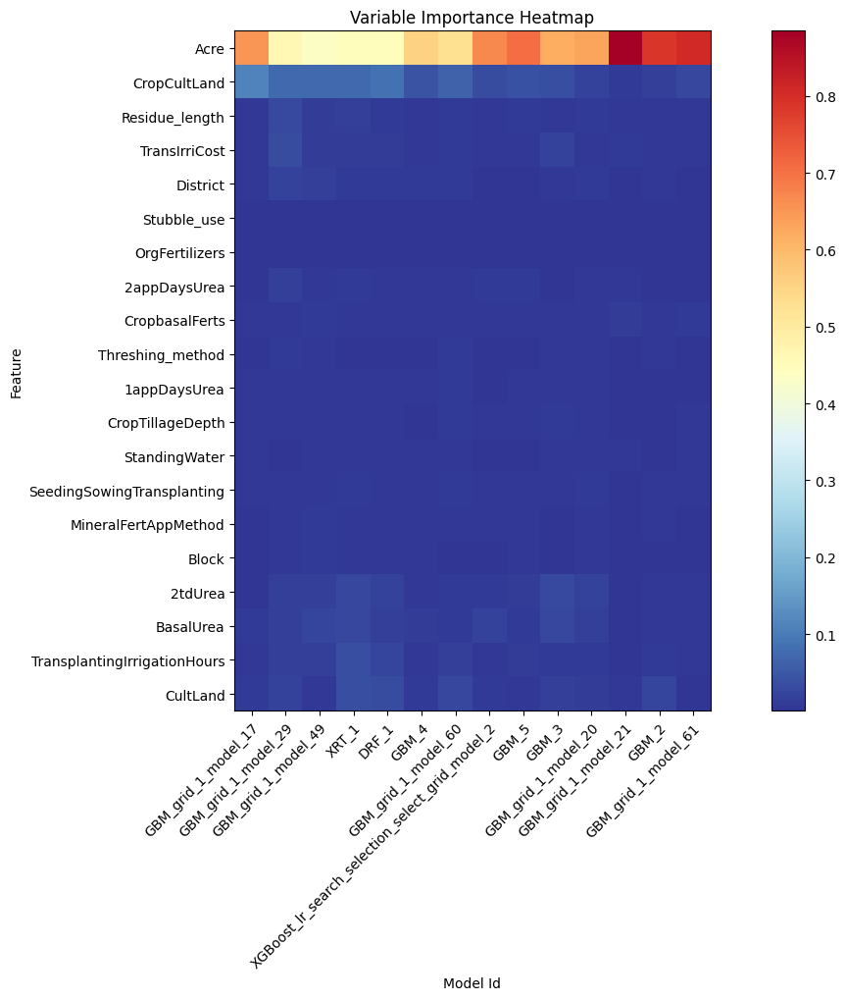

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

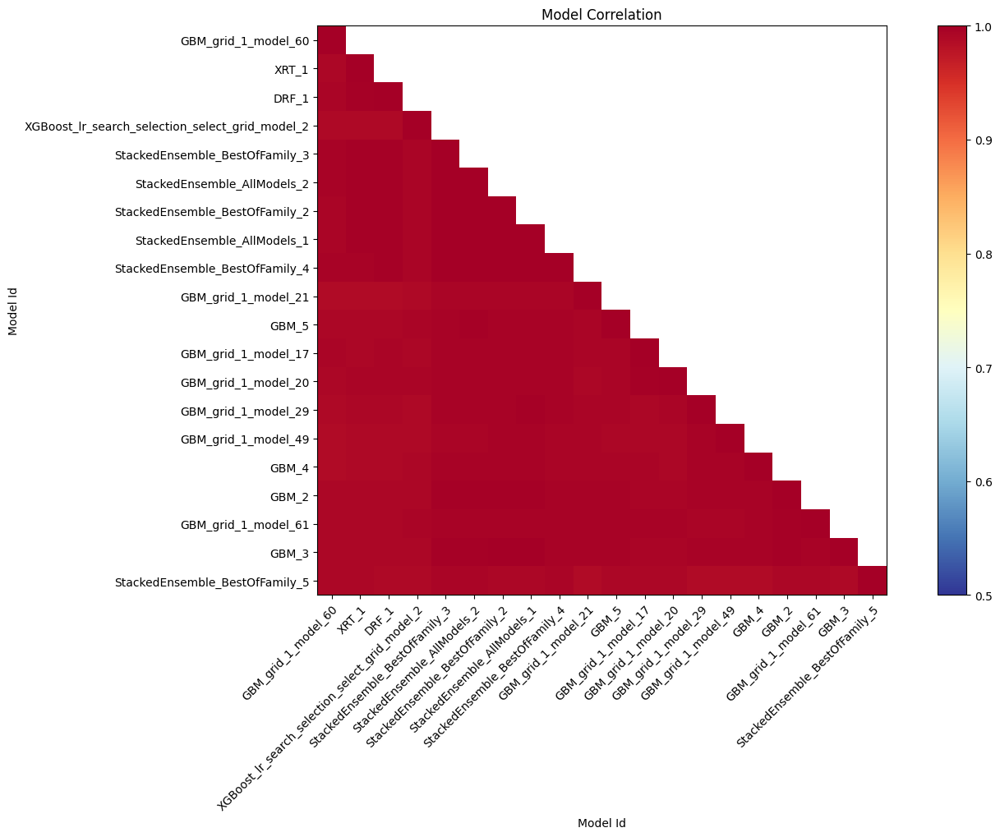

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

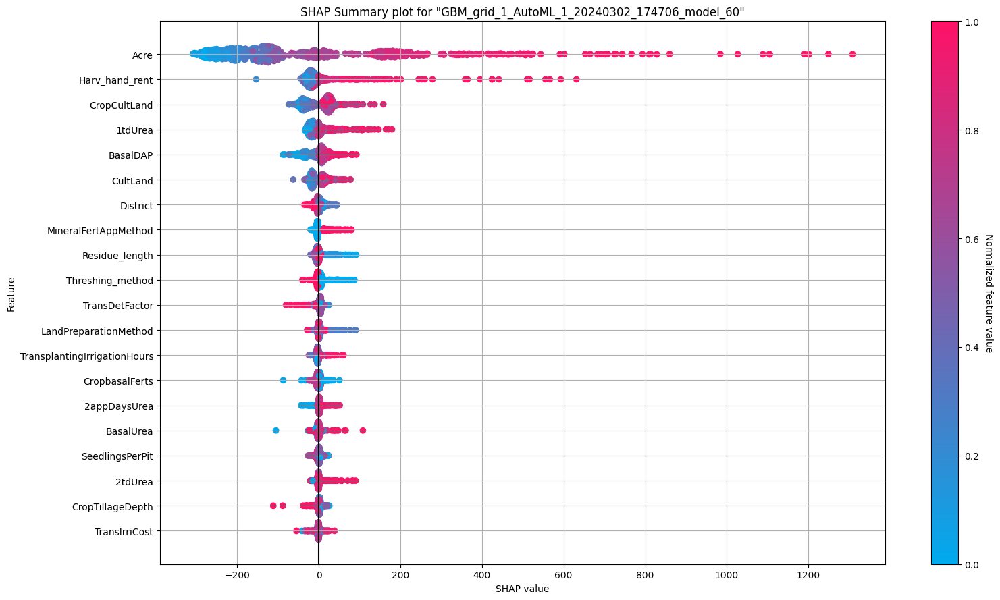

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

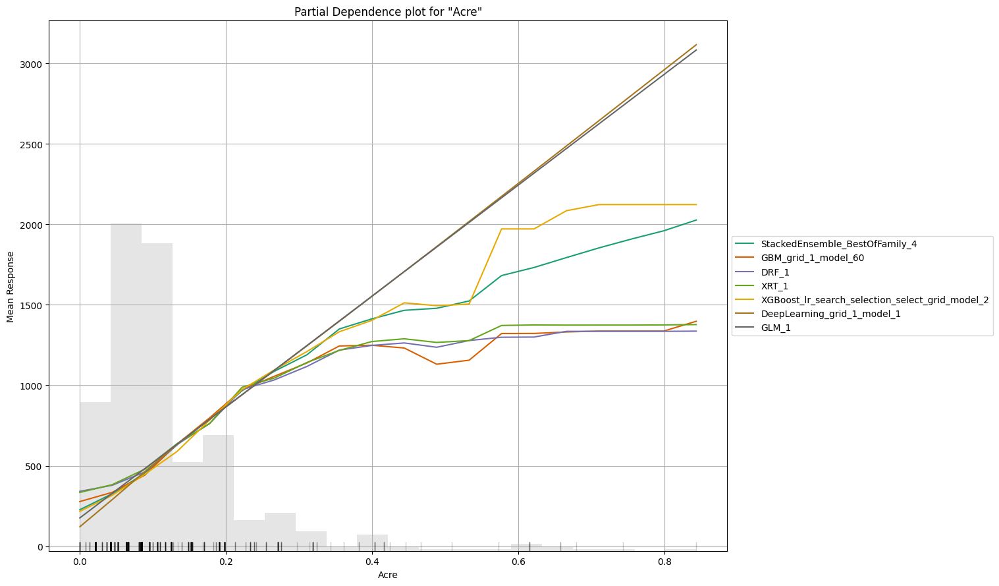

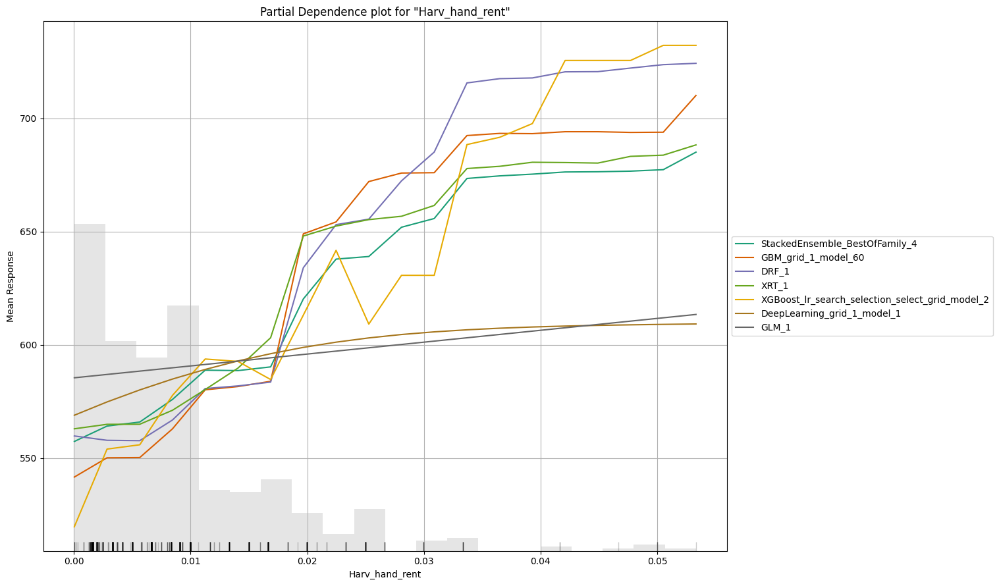

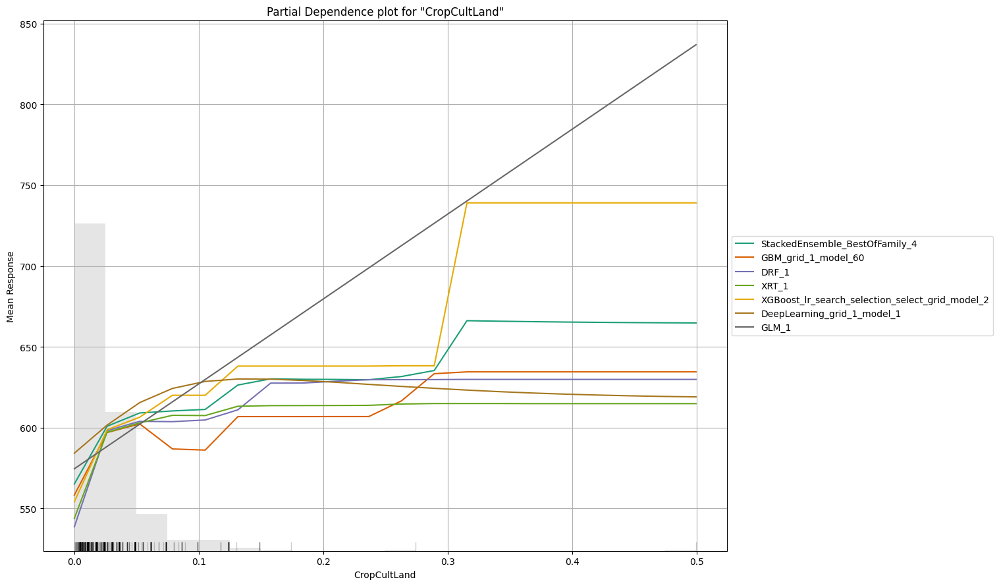

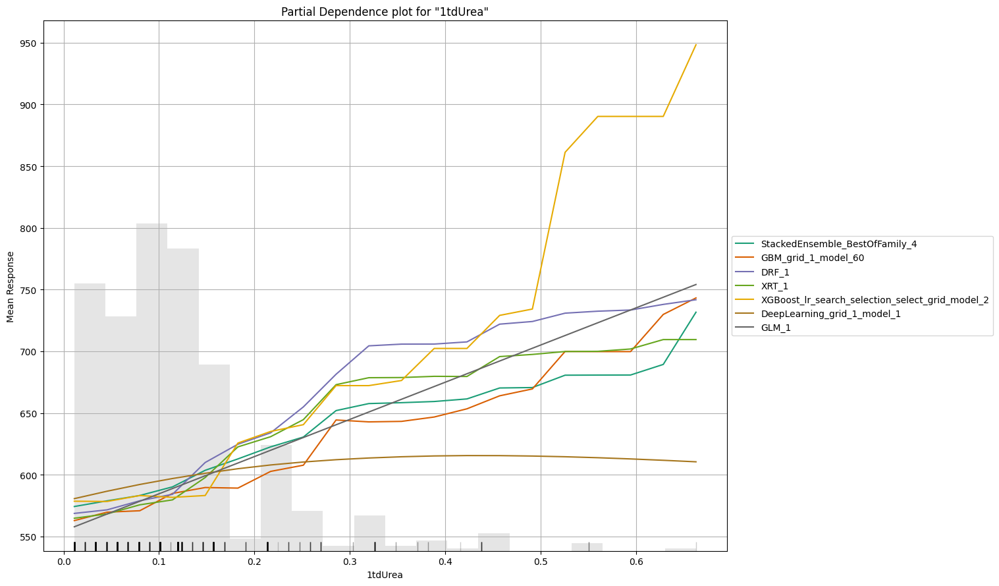

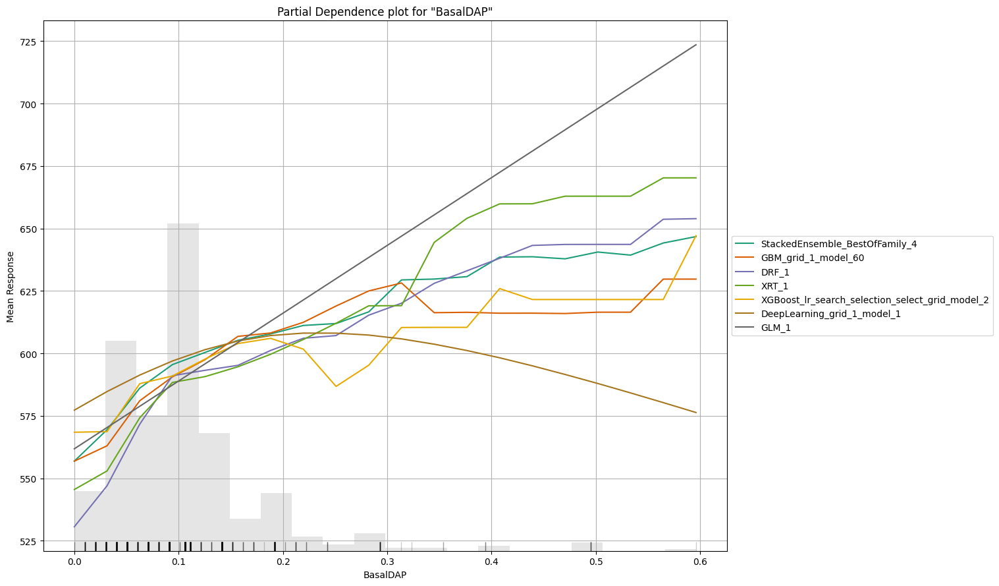

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

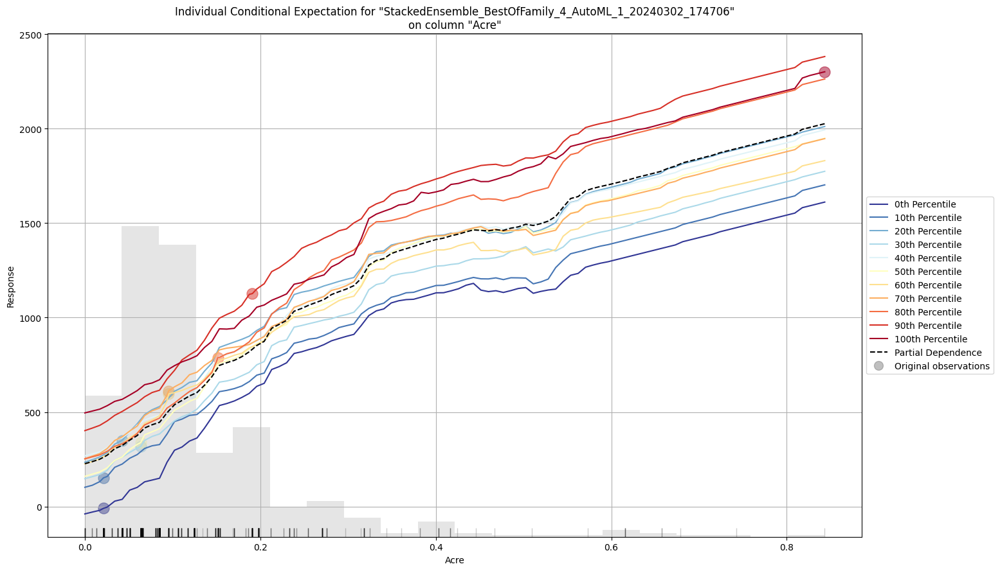

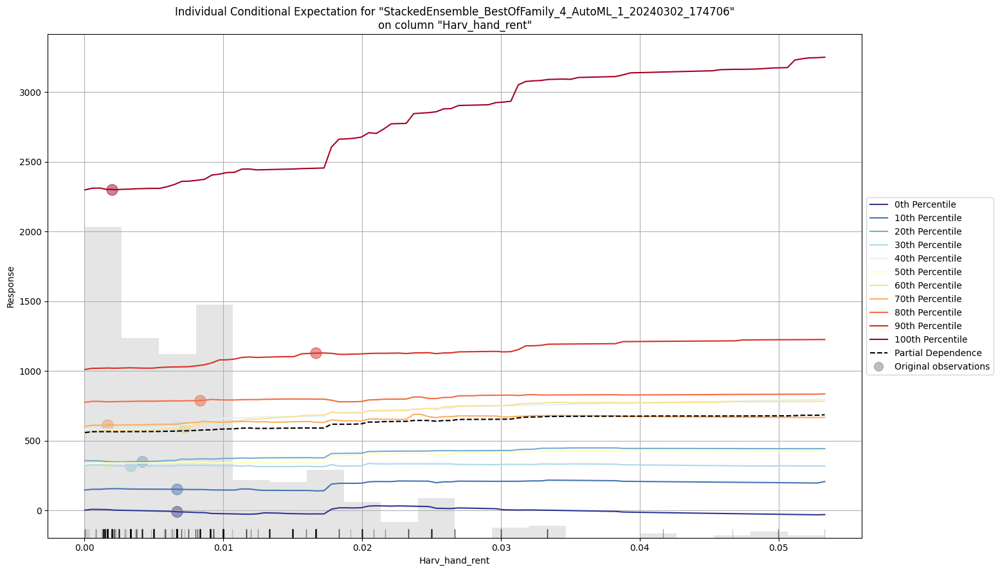

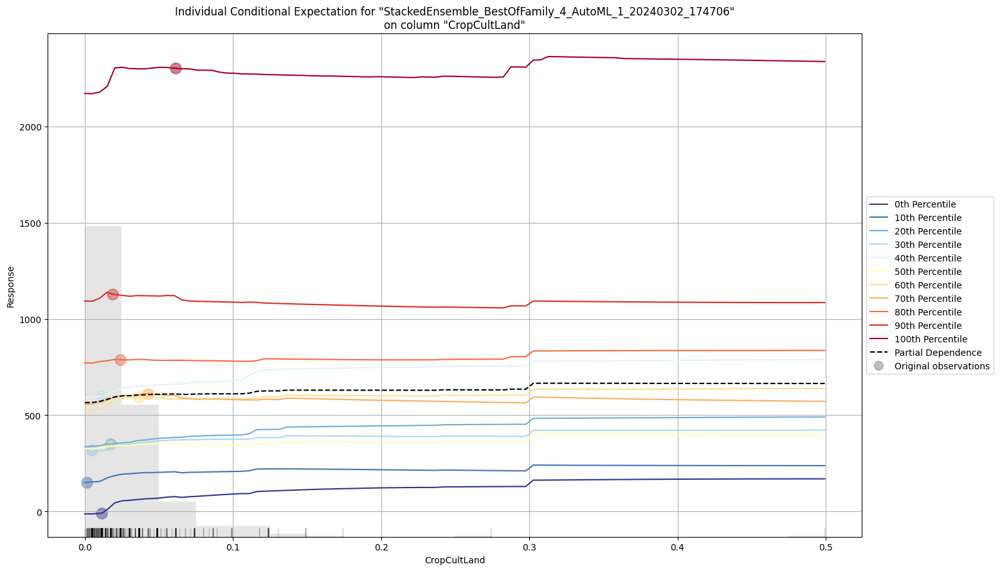

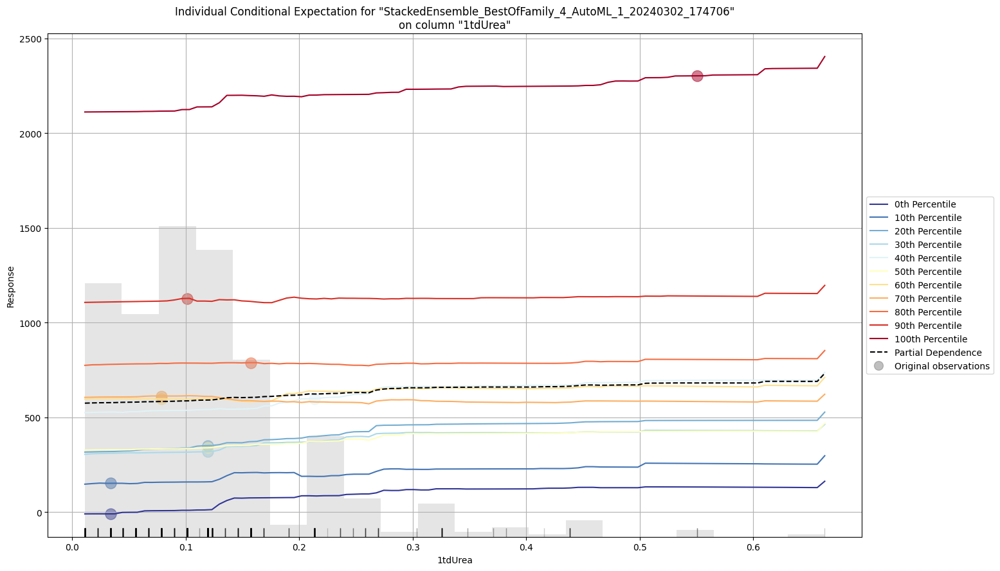

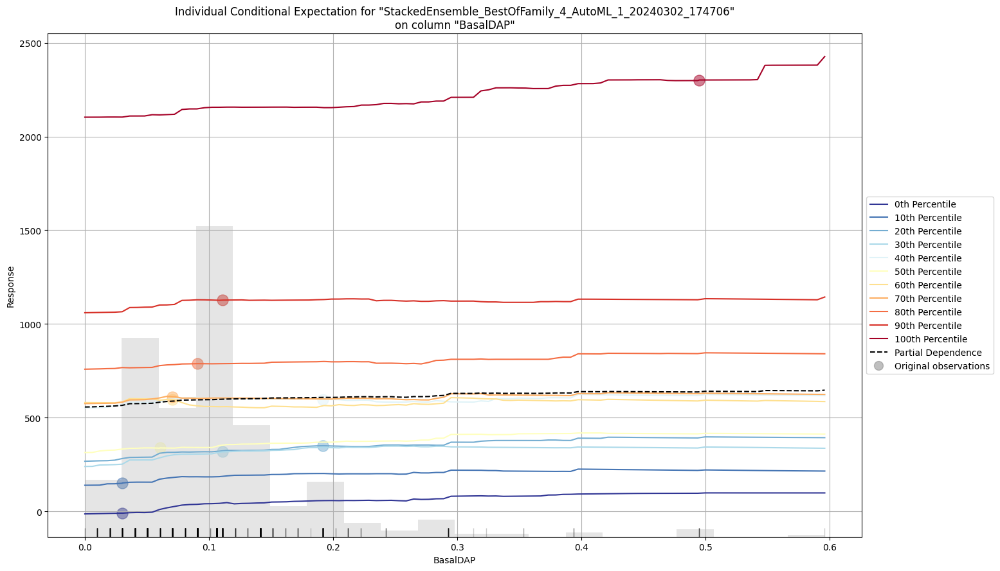

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

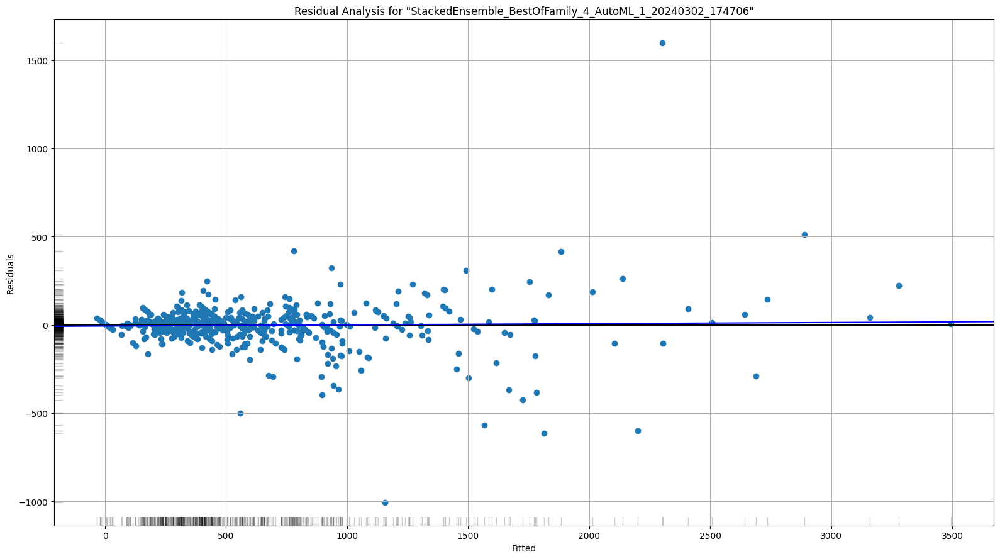

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

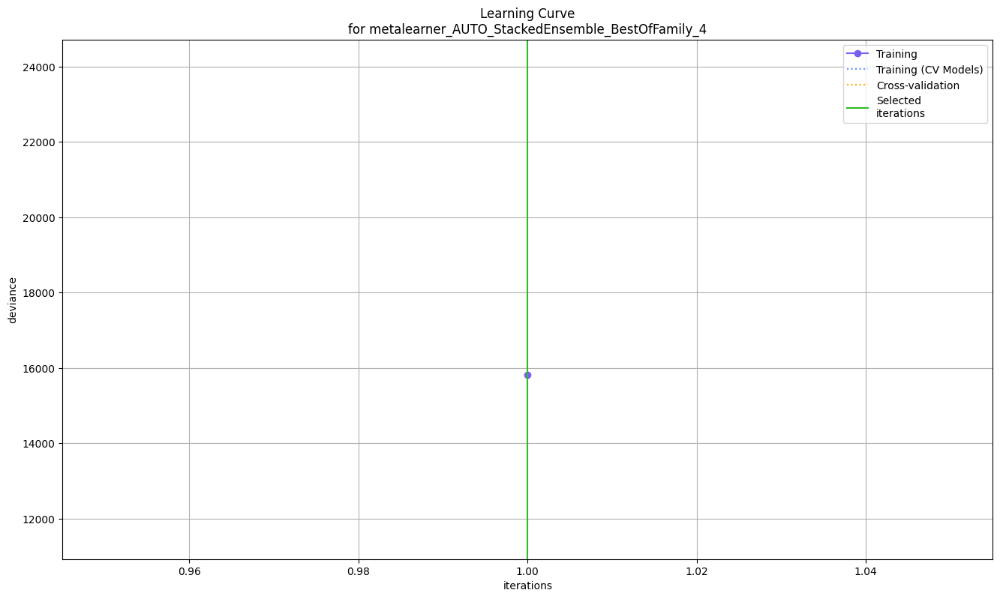

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

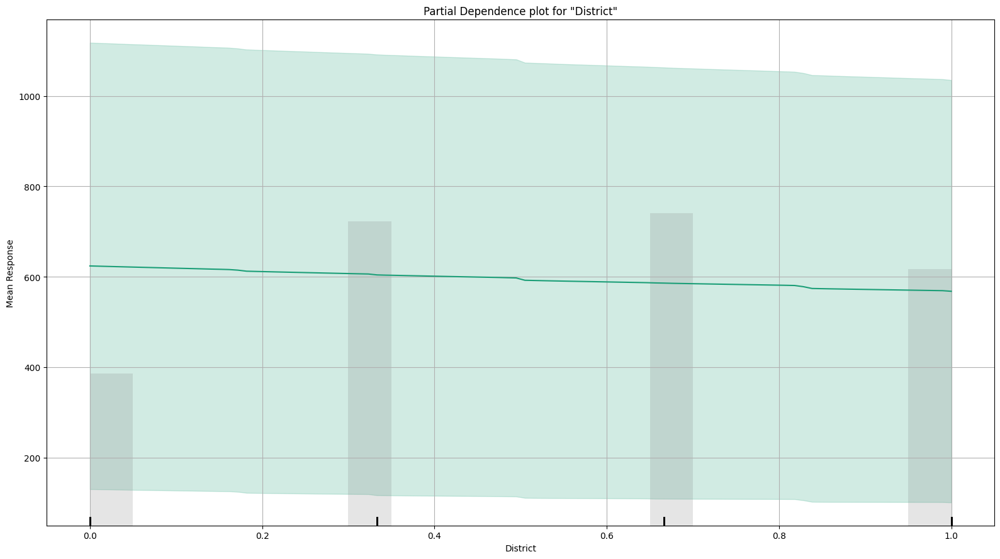

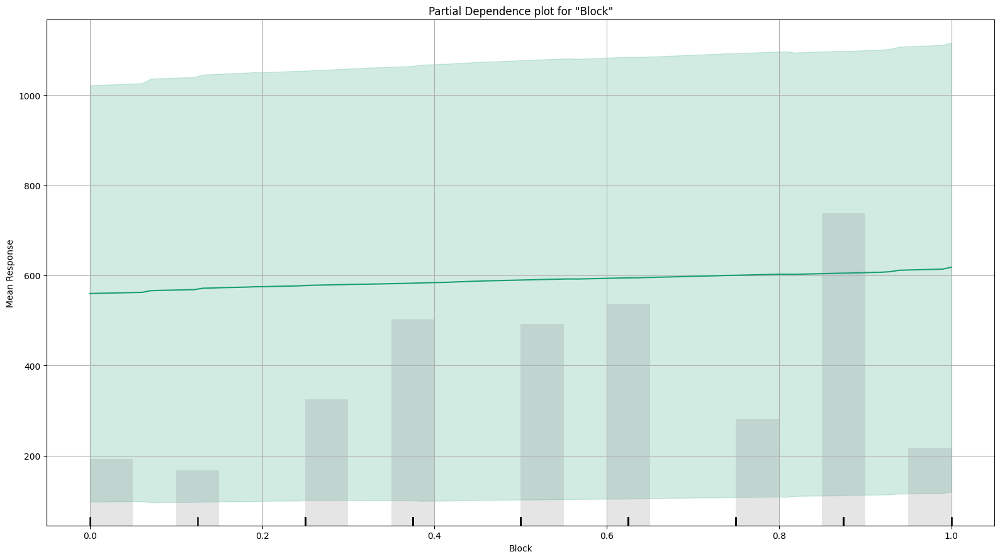

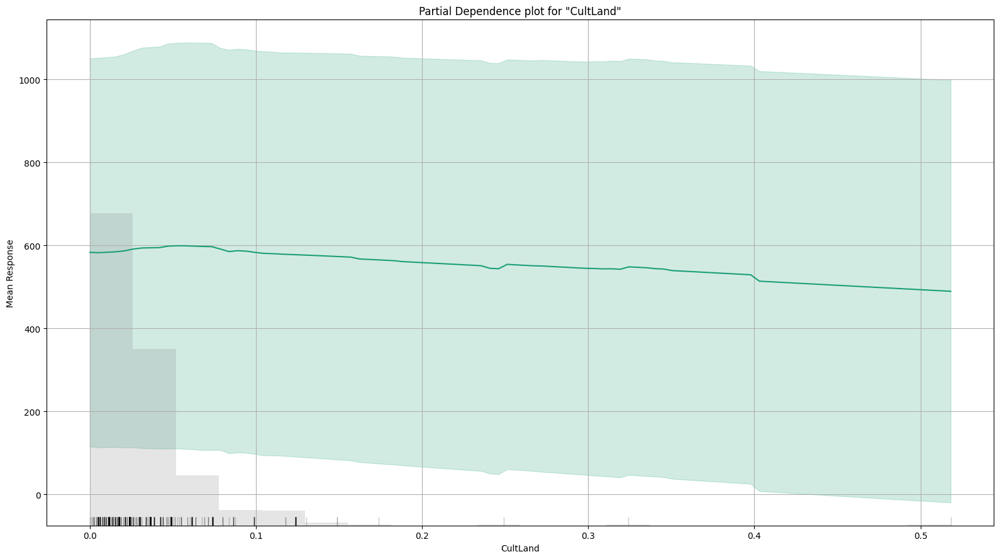

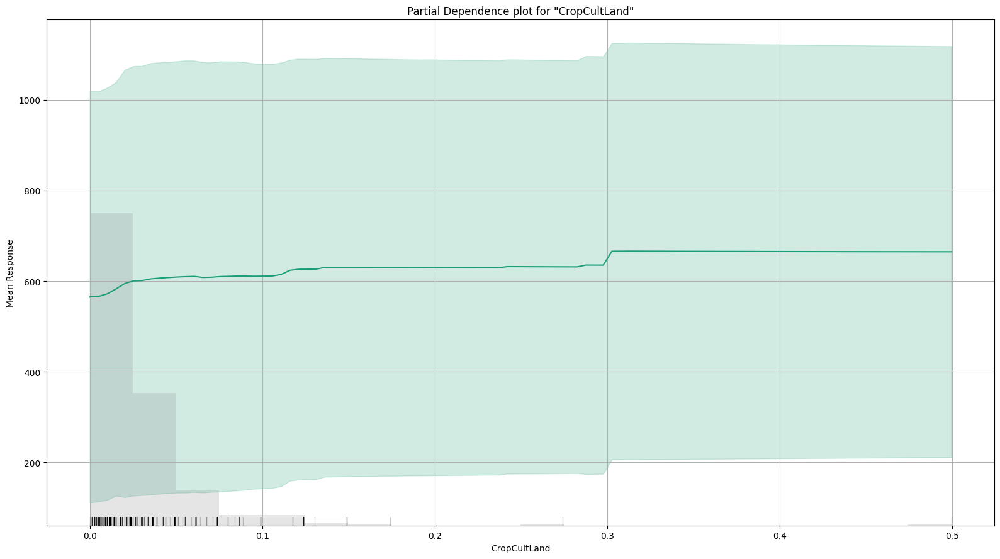

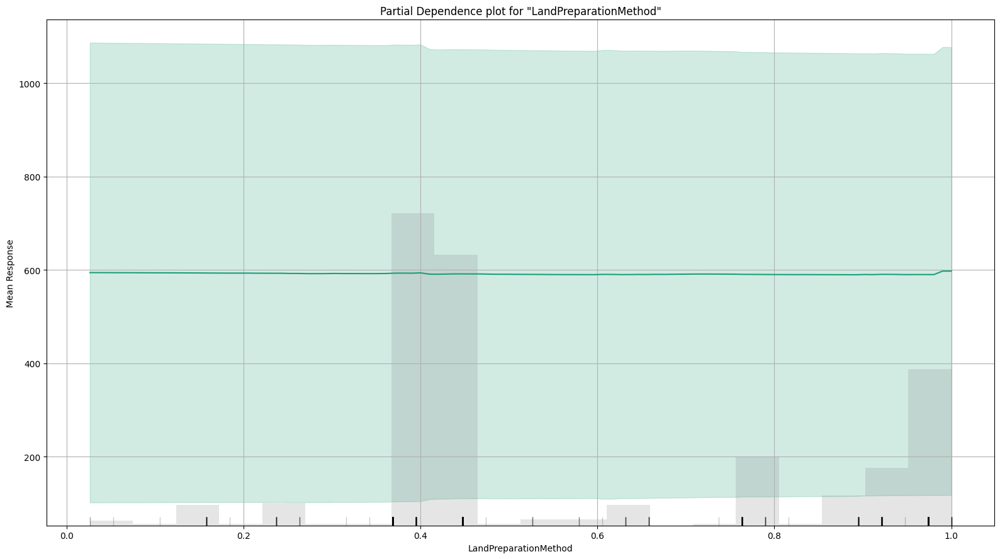

...

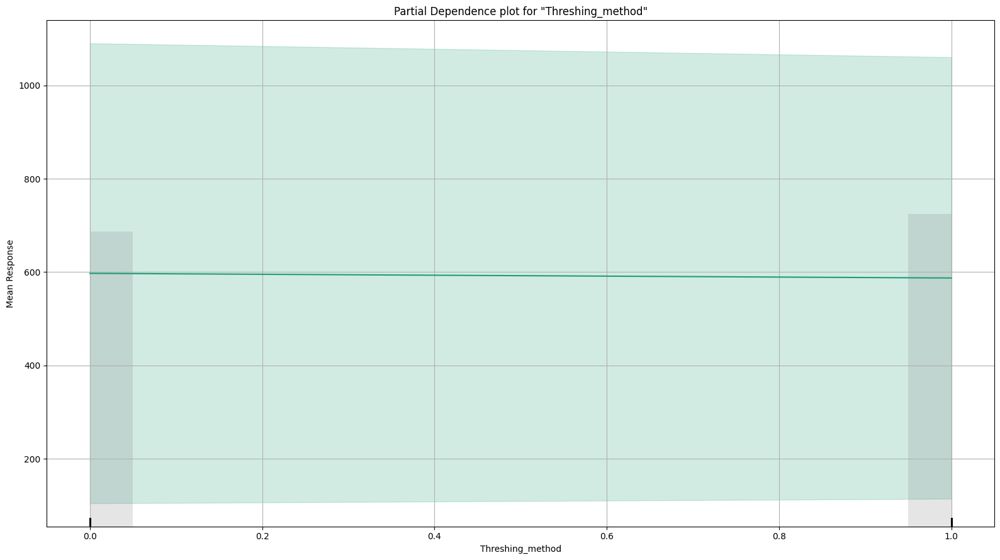

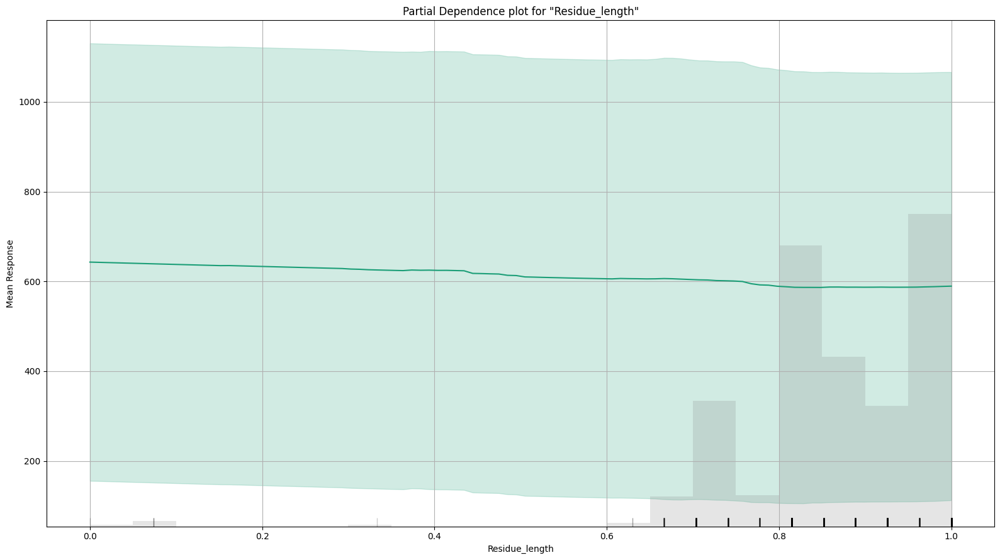

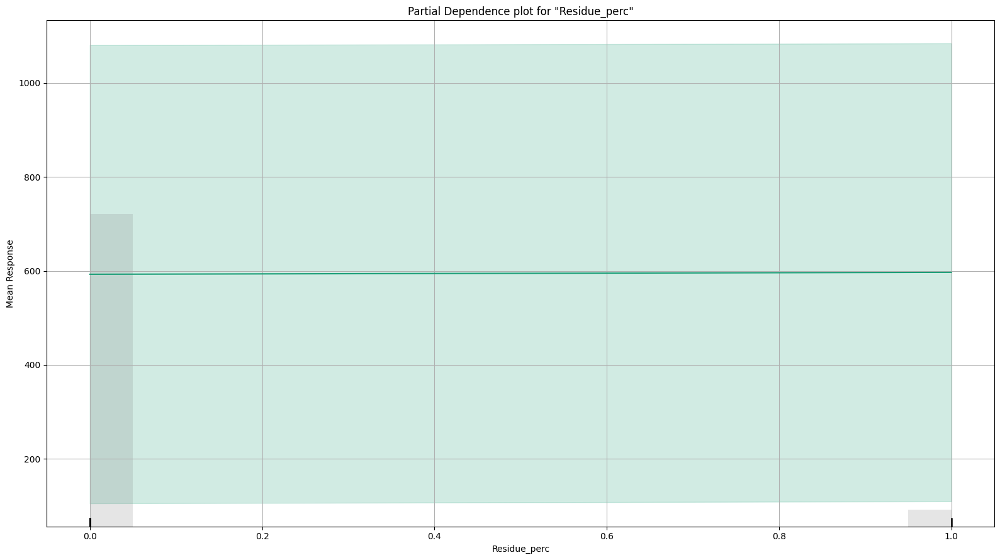

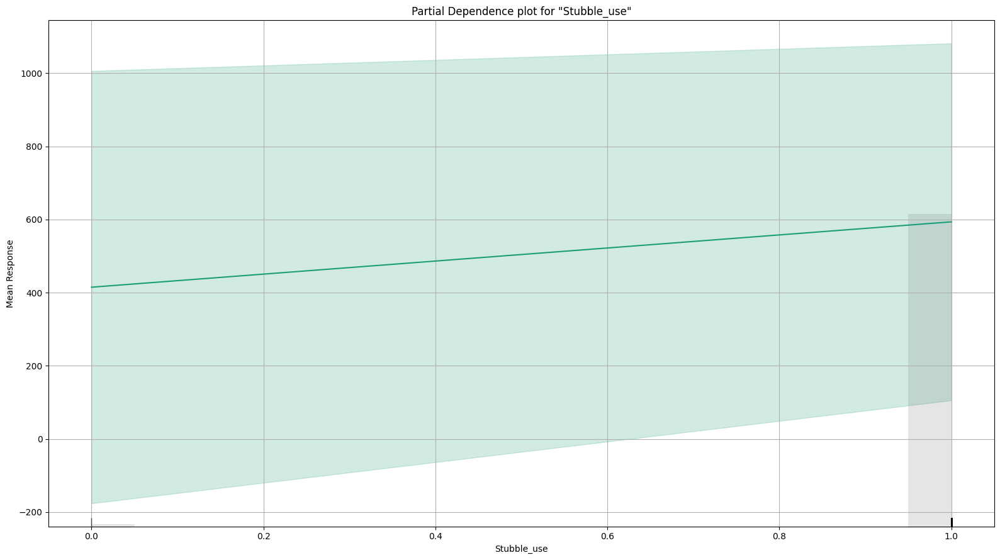

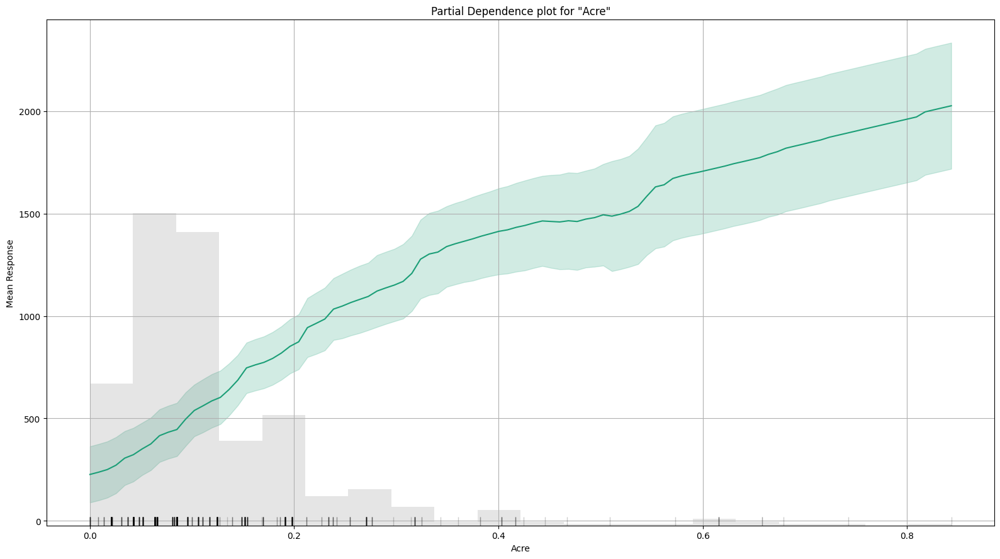

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

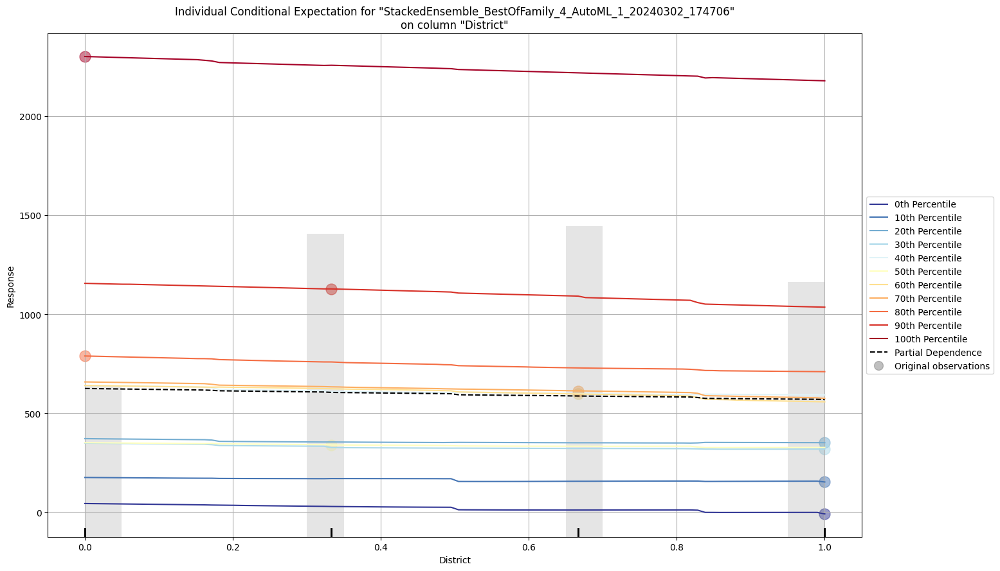

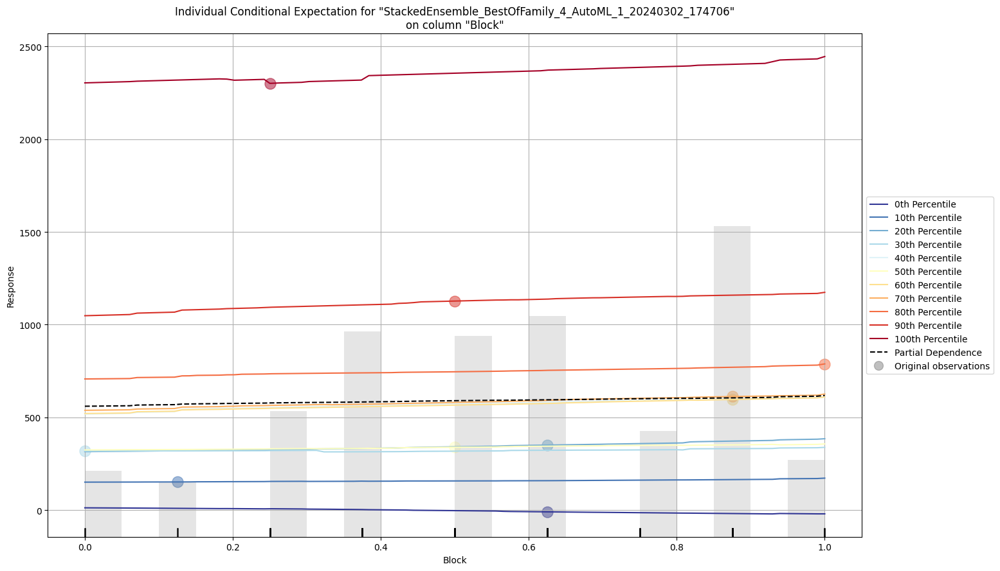

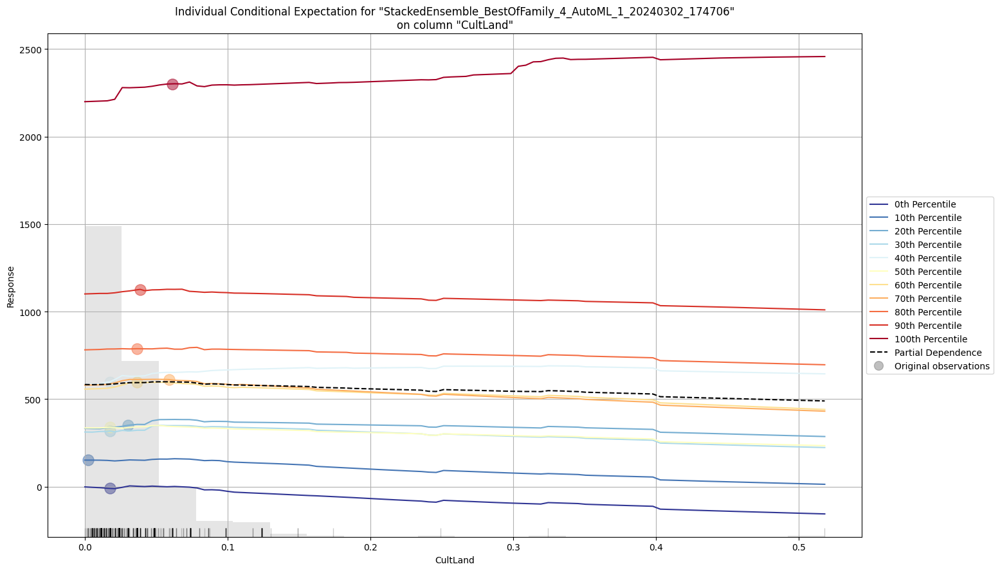

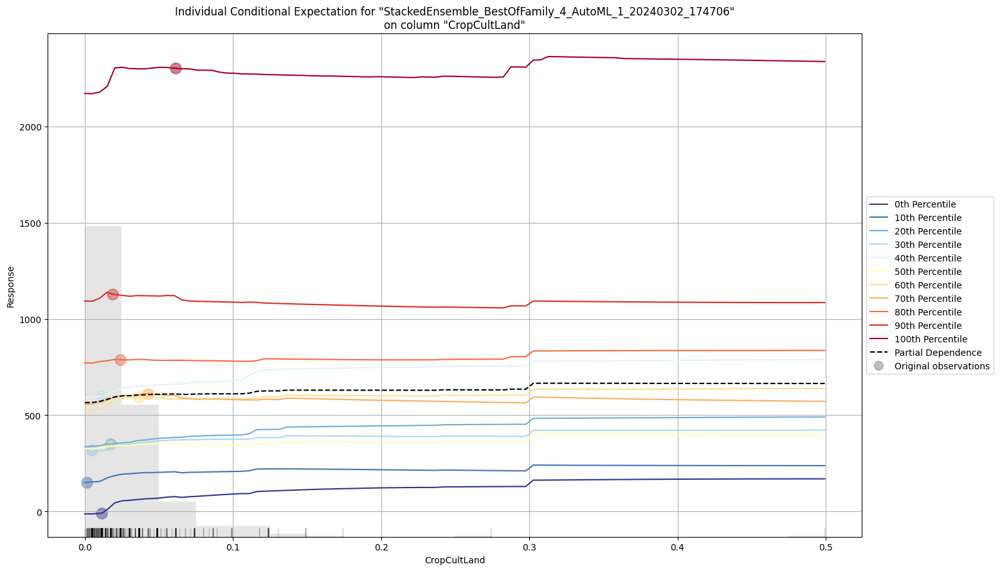

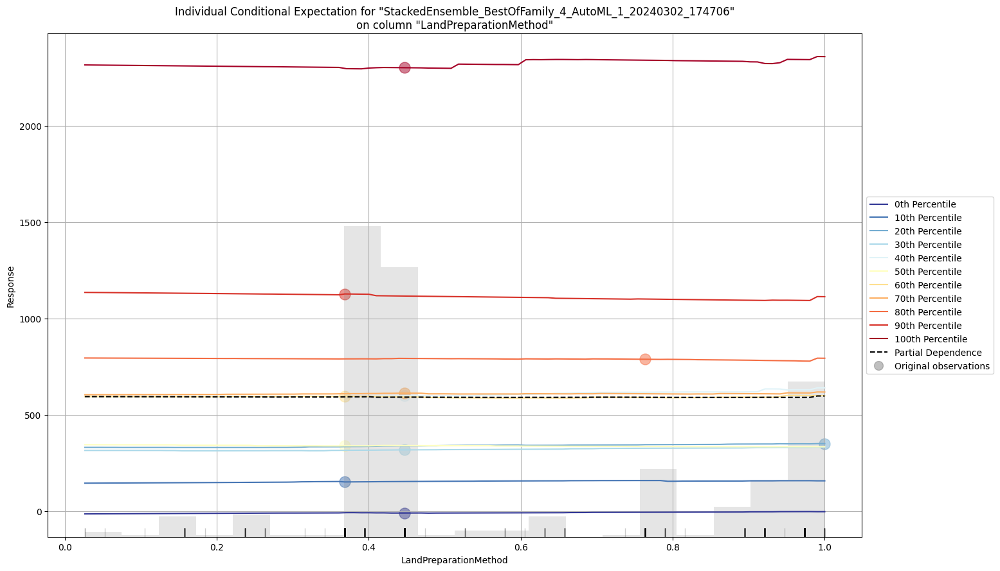

...

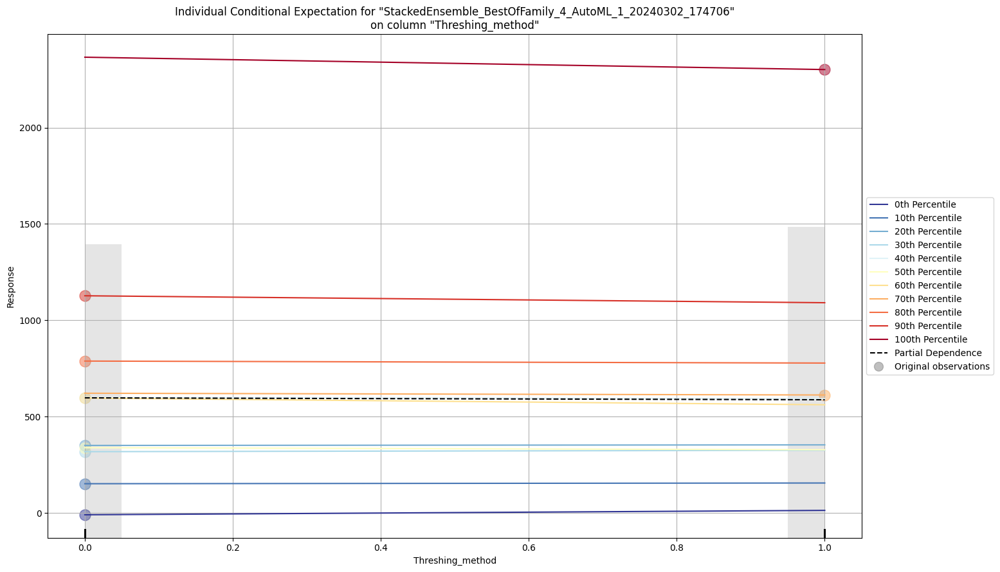

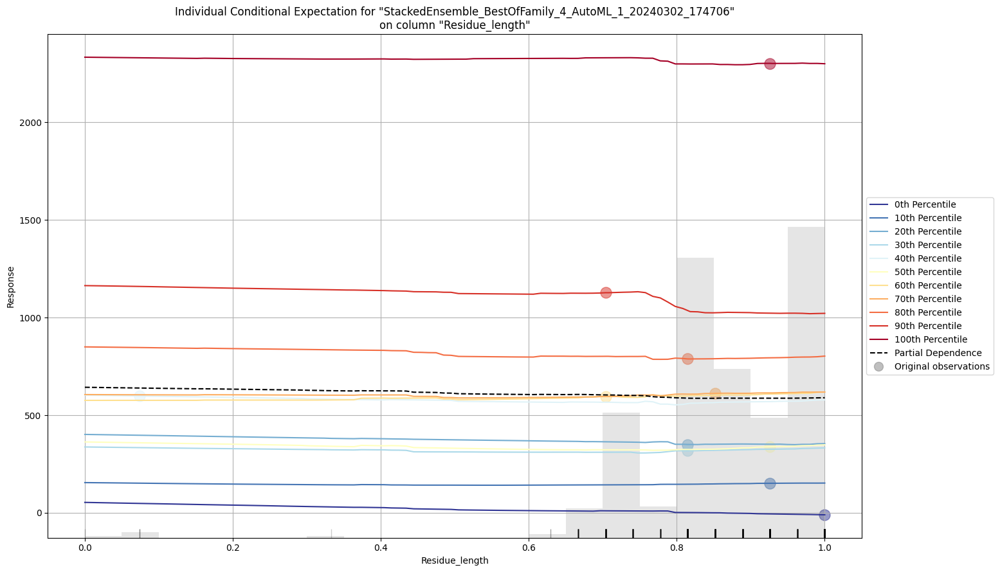

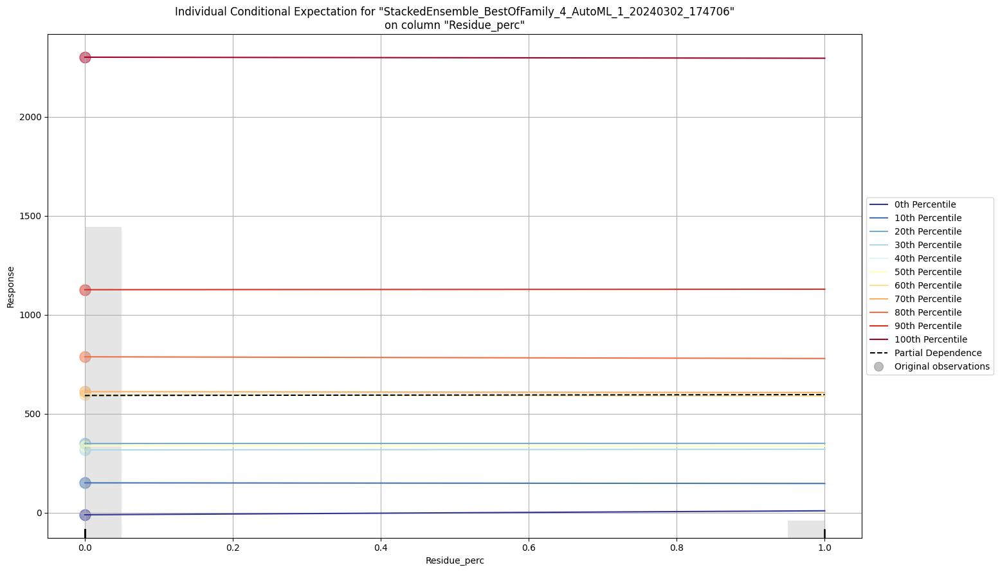

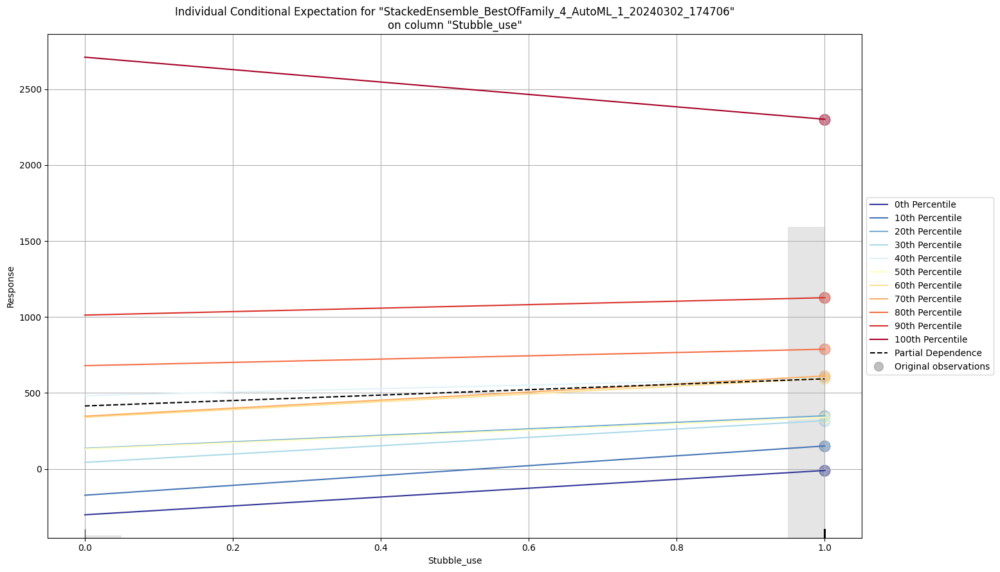

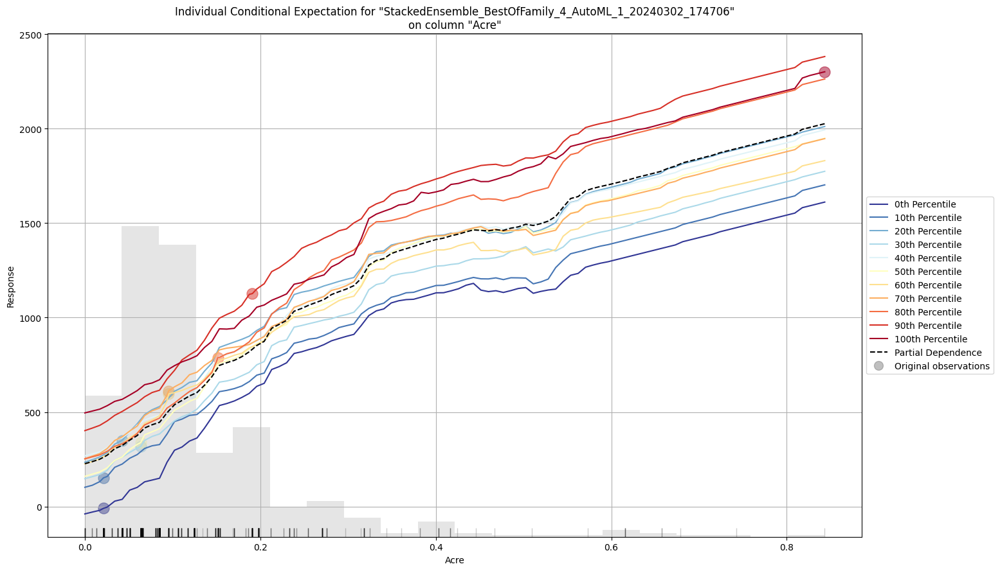

In [2]:
# Evaluate model
pred = aml.leader.predict(h2o_test)

# Get leaderboard with all possible columns
lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")
lb

# Get the best XGBoost model, ranked by logloss, this is just an example about how to use the method
# You can also use other algorithms and criterions
xgb = aml.get_best_model(algorithm="xgboost")

perf = aml.leader.model_performance(h2o_test)
print(perf)

# Use the newly developed method from H2o to explain the result
exa = aml.explain(h2o_test)

# Explain a single model
exm = aml.leader.explain(h2o_test)

In [3]:
from tpot import TPOTRegressor

# Instantiate and fit the model
tpot = TPOTRegressor(generations=100, population_size=100, mutation_rate=0.9,
                         crossover_rate=0.1,
                         scoring='neg_mean_squared_error', cv=5,
                         subsample=1.0, n_jobs=-2,max_eval_time_mins=5,
                         verbosity=2, random_state=42)
tpot.fit(X_train, y_train)

# Evaluate the model
predictions = tpot.predict(X_test)

                                                                                
Generation 1 - Current best internal CV score: -18162.815796990926
                                                                                
Generation 2 - Current best internal CV score: -18162.815796990926
                                                                                  
Generation 3 - Current best internal CV score: -18162.815796990926
                                                                                  
Generation 4 - Current best internal CV score: -17959.330217132163
                                                                                
Generation 5 - Current best internal CV score: -17874.436855091848
                                                                                  
Generation 6 - Current best internal CV score: -17874.436855091848
                                                                                  
Generation 7 - Current 

If you want to use the customized score function, run the following sections' command 

In [ ]:
from tpot import TPOTRegressor
from sklearn.metrics import make_scorer

def rmse(y_ture, y_pred):
    return np.sqrt(np.mean((y_ture - y_pred) ** 2)) 

# make a custom scoring function
mean_rmse_scorer = make_scorer(rmse, greater_is_better=False)

# Instantiate and fit the model
tpot = TPOTRegressor(generations=100, population_size=100, mutation_rate=0.9,
                         crossover_rate=0.1,
                         scoring=mean_rmse_scorer, cv=5,
                         subsample=1.0, n_jobs=-2,max_eval_time_mins=5,
                         verbosity=2, random_state=42)
tpot.fit(X_train, y_train)

# Evaluate the model
predictions = tpot.predict(X_test)

In [7]:
# Show the performance of the model
def mean_rmse(y_ture, y_pred):
    return np.sqrt(np.mean((y_ture - y_pred) ** 2))


print(tpot.score(X_test, y_test))
print(mean_rmse(y_test, predictions))

-13980.17239894072
0.19070609527101917


In [5]:
# The tpot package has a special method to export the model to a python file
tpot.export('tpot_cleaned_data_version_pipeline.py')